<a href="https://colab.research.google.com/github/jeffufpost/on_testing/blob/master/on_testing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **On testing, diagnostics, and containment measures with COVID-19 examples**

In [1]:
# The following will be added shortly

## **Introduction**

"Testing Testing Testing" seems to be the most repeated phrase since the start of the epidemic as testing is said to be the key to keeping the COVID-19 pandemic under control and allowing for health systems to withstand the increase in hospitalised patients and specifically those requiring intensive care.

The aim of this short right-up is to clear up some misconceptions around testing protocols in times of an epidemic/pandemic and its importance to guiding public health policies.

Some introductory epidemiological concepts are needed as an introduction 
and how they relate to what we know of how COVID-19 spreads today, the importance of testing, the importance of understanding the results of tests and of strong testing protocols, and the implication for containment measures. 



1.   Importance of data to guide public health policy
2.   Testing
    * Understanding specificity and sensitivity
    * Types of test
3.  Using the data to guide public health policies
    * Understanding importance of prevalence in interpreting results (Positive Predictive Value)
    * Risk assesment and testing protocol
4.  Simulation of testing for an individual

   



## **Importance of data in guiding public health policies**

### Soon to be added

## **On testing and diagnostics**

### *Specificity and Sensitivity*

### *Types of tests*

#### Virological tests (looking for presence of the pathogen/virus)

#### Serological tests (looking for presence of antibodies

## **Testing data and guiding public health policies**

### *Prevalence and interpretation of test results*

### *Assesing risks and establishing testing protocols*

## **Serology testing simulation for individuals** 

In [49]:
import numpy as np
import plotly.express as px
import plotly.graph_objects as go

In [50]:
# Look at description above for explanation of probabilites
# Below are hypothetical probabilities:
num=10000
Pprior = np.linspace((1/num),(num-1)/num,num=num)  # This is the prior probability of being infected, given by Doctor's judgement
Sn = 0.95         # Sensitivity of test
Sp = 0.95         # Specificity of test
#Ppositive = Sn * Pprior + (1-Sp) * (1-Pprior)

In [51]:
def Pposterior(Pprior, test_res):
  if test_res:
    return ((Sn * Pprior) / (Sn * Pprior + (1-Sp) * (1-Pprior)))
  else:
    return (1-((Sp * (1-Pprior))/(1-(Sn * Pprior + (1-Sp) * (1-Pprior)))))

In [56]:
Pposterior(0.5, True)

0.95

In [53]:
Pposterior(0.5, False)

0.050000000000000044

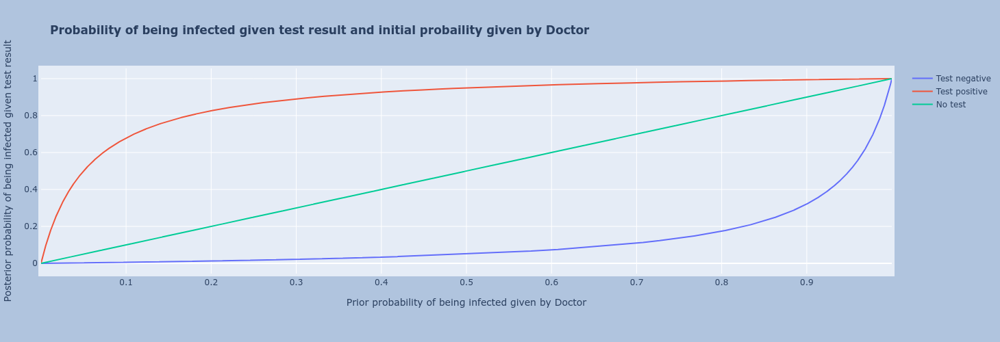

In [54]:
fig = go.Figure(data=[
    go.Scatter(name='Test negative', x=Pprior, y=Pposterior(Pprior, False)),
    go.Scatter(name='Test positive', x=Pprior, y=Pposterior(Pprior, True)),
    go.Scatter(name='No test', x=Pprior, y=Pprior)
])

fig.update_layout(
    title= '<b>Probability of being infected given test result and initial probaility given by Doctor</b>',
    xaxis_title = 'Prior probability of being infected given by Doctor',
    yaxis_title = 'Posterior probability of being infected given test result'
)

fig.update_layout(
    autosize=False,
    width=800,
    height=500,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
    paper_bgcolor="LightSteelBlue",
)

fig.show()

## What about multiple tests in a row

In [47]:
# If two tests are done:
# Four options:
# Positive - Positive
# Positive - Negative
# Negative - Positive
# Negative - Negatve
fig = go.Figure(data=[
    go.Scatter(name='Pos, Pos', x=Pprior, y=Pposterior(Pposterior(Pprior, 1), 1)),
    go.Scatter(name='Pos, Neg', x=Pprior, y=Pposterior(Pposterior(Pprior, 1), 0)),
    go.Scatter(name='Neg, Pos', x=Pprior, y=Pposterior(Pposterior(Pprior, 0), 1)),
    go.Scatter(name='Neg, Neg', x=Pprior, y=Pposterior(Pposterior(Pprior, 0), 0)),
    go.Scatter(name='No test', x=Pprior, y=Pprior)
])

fig.update_layout(
    title= 'Probability of being infected given test result and initial probaility given by Doctor',
    xaxis_title = 'Prior probability of being infected given by Doctor',
    yaxis_title = 'Posterior probability of being infected given test result'
)

fig.show()

TypeError: Pposterior() missing 2 required positional arguments: 'Sens' and 'Spec'

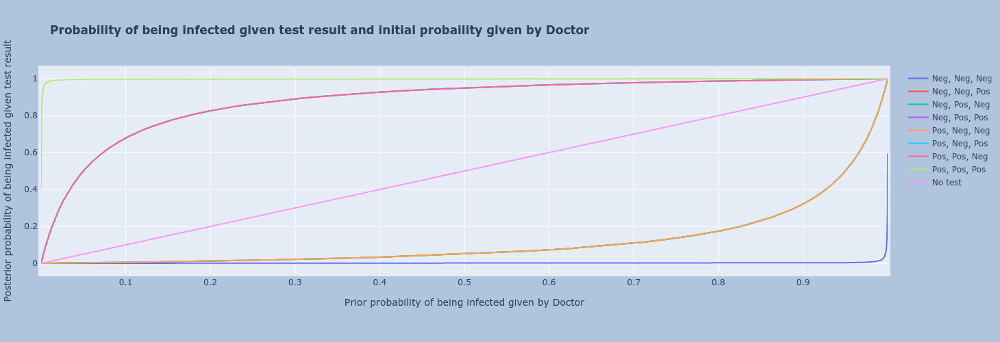

In [19]:
# If three tests are done:
# Nine options:
# 0 0 0
# 0 0 1
# 0 1 0
# 0 1 1
# 1 0 0
# 1 0 1
# 1 1 0
# 1 1 1

fig = go.Figure(data=[
    go.Scatter(name='Neg, Neg, Neg', x=Pprior, y=Pposterior(Pposterior(Pposterior(Pprior, 0), 0), 0)),
    go.Scatter(name='Neg, Neg, Pos', x=Pprior, y=Pposterior(Pposterior(Pposterior(Pprior, 0), 0), 1)),
    go.Scatter(name='Neg, Pos, Neg', x=Pprior, y=Pposterior(Pposterior(Pposterior(Pprior, 0), 1), 0)),
    go.Scatter(name='Neg, Pos, Pos', x=Pprior, y=Pposterior(Pposterior(Pposterior(Pprior, 0), 1), 1)),
    go.Scatter(name='Pos, Neg, Neg', x=Pprior, y=Pposterior(Pposterior(Pposterior(Pprior, 1), 0), 0)),
    go.Scatter(name='Pos, Neg, Pos', x=Pprior, y=Pposterior(Pposterior(Pposterior(Pprior, 1), 0), 1)),
    go.Scatter(name='Pos, Pos, Neg', x=Pprior, y=Pposterior(Pposterior(Pposterior(Pprior, 1), 1), 0)),
    go.Scatter(name='Pos, Pos, Pos', x=Pprior, y=Pposterior(Pposterior(Pposterior(Pprior, 1), 1), 1)),
    go.Scatter(name='No test', x=Pprior, y=Pprior)
])

fig.update_layout(
    title= '<b>Probability of being infected given test result and initial probaility given by Doctor</b>',
    xaxis_title = 'Prior probability of being infected given by Doctor',
    yaxis_title = 'Posterior probability of being infected given test result'
)

fig.update_layout(
    autosize=False,
    width=800,
    height=500,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
    paper_bgcolor="LightSteelBlue",
)

fig.show()

In [48]:
# Using a new function with currying and a series as test results

In [49]:
def Pposterior(Pprior, test_res):
  if test_res:
    return ((Sn * Pprior) / (Sn * Pprior + (1-Sp) * (1-Pprior)))
  else:
    return (1-((Sp * (1-Pprior))/(1-(Sn * Pprior + (1-Sp) * (1-Pprior)))))

In [50]:
def mult(Pprior, test_res):
  i = 0
  x = Pprior
  tr = test_res 
  while i < len(test_res):
    if tr[0] == 1:
      i = i + 1
      x, tr = Pposterior(x, tr[0]), tr[1:]
    else:
      i = i + 1
      x, tr = Pposterior(x, tr[0]), tr[1:]
  return x

In [51]:
test_results = [1,1,0,0]

In [52]:
y = mult(Pprior, test_results)

ValueError: operands could not be broadcast together with shapes (4,) (10000,) 

In [53]:
# What about test with different sensitivities and specificities

In [54]:
Sn = 0.98         # Sensitivity of test
Sp = 0.98         # Specificity of test
mult(0.5, [1,1,0,0])

0.5000000000000595

In [55]:
Sn = 0.95         # Sensitivity of test
Sp = 0.98         # Specificity of test
mult(0.5, [1,1,0,0])

0.8545074439196926

In [56]:
def Pposterior(Pprior, test_res, Sens, Spec):
  if test_res:
    return ((Sens * Pprior) / (Sens * Pprior + (1-Spec) * (1-Pprior)))
  else:
    return (1-((Spec * (1-Pprior))/(1-(Sens * Pprior + (1-Spec) * (1-Pprior)))))

In [57]:
def PposteriorM(Pprior, test_res, Sens, Spec):
  i = 0
  x = Pprior
  tr = test_res 
  Sn = Sens
  Sp = Spec
  while i < len(test_res):
    if tr[0] == 1:
      i = i + 1
      x, tr, Sn, Sp = (Sn[0] * x) / (Sn[0] * x + (1-Sp[0]) * (1-x)), tr[1:], Sn[1:], Sp[1:]
    elif tr[0] == 0:
      i = i + 1
      x, tr, Sn, Sp = (1-((Sp[0] * (1-x))/(1-(Sn[0] * x + (1-Sp[0]) * (1-x))))), tr[1:], Sn[1:], Sp[1:]
  return x

In [58]:
test_results = [1,1,0,0]
Sn = [0.98,0.98,0.95,0.95]
Sp = [0.95,0.95,0.98,0.98]

In [59]:
PposteriorM(Pprior, test_results, Sn, Sp)

array([1.00000000e-04, 1.99989999e-04, 2.99979998e-04, ...,
       9.99700020e-01, 9.99800010e-01, 9.99900000e-01])

In [60]:
PposteriorM(0.5,[1,1,0,0],[0.90,0.90,0.98,0.98],[0.95,0.95,.9,.9])

0.13793103448275845

## How about something with sliders for Sensitivity and Specificity

#### With widgets

In [7]:
from ipywidgets import interactive
import numpy as np

x = np.linspace(0, 1, num=1000)

def f(Sn, Sp):
  fig = go.Figure(data=[
                        go.Scatter(name='Test negative', x=x, y=Pposterior(x, False, Sn, Sp)),
                        go.Scatter(name='Test positive', x=x, y=Pposterior(x, True, Sn, Sp)),
                        go.Scatter(name='No test', x=x, y=x)
                        ])
  s = go.FigureWidget(fig)
  s.show()

interactive_plot = interactive(f, Sn=(0.75, 1, 0.01), Sp=(0.75,1, 0.01))
output = interactive_plot.children[-1]
output.layout.height = '350px'
interactive_plot

interactive(children=(FloatSlider(value=0.87, description='Sn', max=1.0, min=0.75, step=0.01), FloatSlider(val…

In [88]:
from ipywidgets import interactive
import numpy as np

Sn=0.87
Sp=0.87

x = np.linspace(0, 1, num=1000)

fig = go.Figure(data=[
    go.Scatter(name='Test negative', x=x, y=Pposterior(x, False, Sn, Sp)),
    go.Scatter(name='Test positive', x=x, y=Pposterior(x, True, Sn, Sp)),
    go.Scatter(name='No test', x=x, y=x)
])
s = go.FigureWidget(fig)

def f(Sn, Sp):
    s.data[0].y = Pposterior(x, False, Sn, Sp)
    s.data[1].y = Pposterior(x, True, Sn, Sp)
    s.show()
    
interactive_plot = interactive(f, Sn=(0.75, 1, 0.01), Sp=(0.75,1, 0.01))
output = interactive_plot.children[-1]
output.layout.height = '350px'
interactive_plot

interactive(children=(FloatSlider(value=0.87, description='Sn', max=1.0, min=0.75, step=0.01), FloatSlider(val…

In [87]:
s.data[0]

Scatter({
    'name': 'Test negative',
    'uid': 'c26d796b-c689-46b8-9cb6-35d9f8a6ae91',
    'x': array([0.      , 0.001001, 0.002002, ..., 0.997998, 0.998999, 1.      ]),
    'y': array([0.00000000e+00, 1.49702323e-04, 2.99660001e-04, ..., 9.86752950e-01,
                9.93338948e-01, 1.00000000e+00])
})

In [79]:
x = np.linspace(0.00, 1, num=1000)
fig = go.Figure(data=[
                      go.Scatter(name='Test negative', x=x, y=Pposterior(x, False, Sn, Sp)),
                      go.Scatter(name='Test positive', x=x, y=Pposterior(x, True, Sn, Sp)),
                      go.Scatter(name='No test', x=x, y=x)
                      ])
fig.show()

ValueError: operands could not be broadcast together with shapes (4,) (1000,) 

In [63]:
from ipywidgets import interact
fig = go.FigureWidget()
scatt=fig.add_scatter()
fig

FigureWidget({
    'data': [{'type': 'scatter', 'uid': '51f9e532-9b17-4ed7-b3bb-927653cf95ec'}], 'layout': {'t…

In [64]:
scatt.data[0]

Scatter({
    'uid': '51f9e532-9b17-4ed7-b3bb-927653cf95ec'
})

In [70]:
f = go.FigureWidget

fig.update_layout(
    autosize=False,
    width=500,
    height=500,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
    paper_bgcolor="LightSteelBlue",
)

FigureWidget({
    'data': [{'line': {'color': 'blue'},
              'type': 'scatter',
              'uid': …

In [71]:
f.show

<function plotly.basedatatypes.BaseFigure.show(self, *args, **kwargs)>

In [73]:
xs = np.linspace(0, 6, 100)

@interact(freq = (1.0, 4.0, 0.01), phase = (0, 10.0, 0.01), color = ['red', 'green', 'blue'])
def update(freq = 3.6, phase = 4.3, color = 'blue'):
  with fig.batch_update():
    scatt.data[0].x = xs
    scatt.data[0].y = np.sin(freq*xs-phase)
    scatt.data[0].line.color = color
  fig.show()

interactive(children=(FloatSlider(value=3.6, description='freq', max=4.0, min=1.0, step=0.01), FloatSlider(val…

In [77]:
import numpy as np
import plotly.graph_objects as go
from ipywidgets import interact

xs = np.arange(0, 1, 0.0001)

fig = go.FigureWidget()

fig.update_layout(
    autosize=False,
    width=500,
    height=500,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
    paper_bgcolor="LightSteelBlue",
)

fig.add_scatter()
fig.add_scatter()
fig.add_scatter()

fig.data[0].line.color='black'
fig.data[1].line.color='red'
fig.data[2].line.color='green'

fig.data[0].name='No test given'
fig.data[1].name='Test positive'
fig.data[2].name='Test negative'

fig.data[0].x=xs
fig.data[1].x=xs
fig.data[2].x=xs

fig.data[0].y=xs

@interact(sens=(0.8, 1.0, 0.01), spec=(0.8, 1.0, 0.01))
def update(sens=0.95, spec=0.95):
    with fig.batch_update():
        fig.data[1].y=((sens * xs) / (sens * xs + (1-spec) * (1-xs)))
        fig.data[2].y=(1-((spec * (1-xs))/(1-(sens * xs + (1-spec) * (1-xs)))))
    fig.show()

interactive(children=(FloatSlider(value=0.95, description='sens', max=1.0, min=0.8, step=0.01), FloatSlider(va…

In [44]:
fig.data

(Scatter({
     'line': {'color': 'black'},
     'uid': 'fc62b2d1-6bc8-421b-82c3-db922f6ed0ca',
     'x': array([0.000e+00, 1.000e-04, 2.000e-04, ..., 9.997e-01, 9.998e-01, 9.999e-01]),
     'y': array([0.000e+00, 1.000e-04, 2.000e-04, ..., 9.997e-01, 9.998e-01, 9.999e-01])
 }),
 Scatter({
     'line': {'color': 'red'},
     'uid': '52b482e9-7c32-4fe1-8060-649af754a80b',
     'x': array([0.000e+00, 1.000e-04, 2.000e-04, ..., 9.997e-01, 9.998e-01, 9.999e-01]),
     'y': array([0.00000000e+00, 6.15067619e-04, 1.22950190e-03, ..., 9.99951238e-01,
                 9.99967495e-01, 9.99983749e-01])
 }),
 Scatter({
     'line': {'color': 'green'},
     'uid': 'b2fc7859-efa3-4578-afad-269933052100',
     'x': array([0.000e+00, 1.000e-04, 2.000e-04, ..., 9.997e-01, 9.998e-01, 9.999e-01]),
     'y': array([0.00000000e+00, 2.29902763e-05, 4.59840941e-05, ..., 9.98696310e-01,
                 9.99130583e-01, 9.99565146e-01])
 }))

In [217]:
!pip install plotly-4.5.0

ERROR: Could not find a version that satisfies the requirement plotly-4.5.0 (from versions: none)
ERROR: No matching distribution found for plotly-4.5.0


In [ ]:

# Add traces, one for each slider step
x = np.arange(0, 1, 0.0001)

for Sens in np.arange(0.5, 1, 0.01):
  for Spec in np.arange(0.5, 1, 0.01):
    fig.add_trace(
        go.Scatter(
            visible=False,
            line=dict(color="#FF0000", width=6),
            name="Posterior probability - positive test result",
            x=x,
            y=((Sens * x) / (Sens * x + (1-Spec) * (1-x))),
            hovertemplate = '<i>Positive test</i>'+'<br><b>Sensitivity</b>: %{Sens}<br>'+'<br><b>Specificty</b>: %{Spec}<br>')        
    ),
    fig.add_trace(
        go.Scatter(
            visible=False,
            line=dict(color="#00FF00", width=6),
            name="Posterior probability - negative test result",
            x=x,
            y=(1-((Spec * (1-x))/(1-(Sens * x + (1-Spec) * (1-x))))),
            hovertemplate = '<i>Negative test</i>'+'<br><b>Sensitivity</b>: %{Sens}<br>'+'<br><b>Specificty</b>: %{Spec}<br>')
    )


In [ ]:
fig.data[0]

Scatter({
    'hovertemplate': ('<i>Positive test</i><br><b>Sen' ... '<b>Specificty</b>: %{Spec}<br>'),
    'line': {'color': '#FF0000', 'width': 6},
    'name': 'Posterior probability - positive test result',
    'visible': False,
    'x': array([0.000e+00, 1.000e-04, 2.000e-04, ..., 9.997e-01, 9.998e-01, 9.999e-01]),
    'y': array([0.000e+00, 1.000e-04, 2.000e-04, ..., 9.997e-01, 9.998e-01, 9.999e-01])
})

In [5]:
# Make 96th trace visible
fig.data[0].visible = True
fig.data[1].visible = True

fig.show()

NameError: name 'fig' is not defined

In [2]:
### Another attempt at Bokeh

In [3]:
import bokeh

ModuleNotFoundError: No module named 'bokeh'

In [4]:
from bokeh.io import output_notebook, show
from bokeh.plotting import figure
output_notebook()

from bokeh.layouts import column
from bokeh.models import CustomJS, ColumnDataSource, Slider

x = [x*0.005 for x in range(0, 201)]

source = ColumnDataSource(data=dict(x=x, y=x))

plot = figure(plot_width=800, plot_height=400)
plot.line('x', 'y', source=source, line_width=3, line_alpha=0.6)

slider = Slider(start=0.1, end=6, value=1, step=.1, title="power")

update_curve = CustomJS(args=dict(source=source, slider=slider), code="""
    var data = source.data;
    var f = slider.value;
    x = data['x']
    y = data['y']
    for (i = 0; i < x.length; i++) {
        y[i] = Math.pow(x[i], f)
    }
    
    // necessary becasue we mutated source.data in-place
    source.change.emit();
""")
slider.js_on_change('value', update_curve)


show(column(slider, plot))



ModuleNotFoundError: No module named 'bokeh'

In [46]:
import numpy as np
from bokeh.layouts import row, widgetbox
from bokeh.models import CustomJS, Slider
from bokeh.plotting import figure, output_file, show, ColumnDataSource
from bokeh.models import HoverTool

bp.output_file("slider2.html", title="slider.py example")

x = np.arange(0, 1, 0.01)

y0 = (1-((0.95 * (1-x))/(1-(0.95 * x + (1-0.95) * (1-x)))))
y1 = ((0.95 * x) / (0.95 * x + (1-0.95) * (1-x)))
yn = x

source = ColumnDataSource(data=dict(x=x, y0=y0, y1=y1, yn=yn))


plot = bp.figure(plot_width=800, plot_height=400, x_range=(0, 1.1), y_range=(0, 1.1), tools="reset,hover")
plot1 = plot.line('x', 'yn', source=source, line_width=3, line_alpha=0.6, color='black', legend_label='No test')
plot.select(dict(type=HoverTool)).tooltips = {"x":"$x", "y":"$yn"}
plot2 = plot.line('x', 'y0', source=source, line_width=3, line_alpha=0.6, color='green', legend_label='Negative test')
plot.select(dict(type=HoverTool)).tooltips = {"x":"$x", "y":"$y0"}
plot3 = plot.line('x', 'y1', source=source, line_width=3, line_alpha=0.6, color='red', legend_label='Positive test')
plot.select(dict(type=HoverTool)).tooltips = {"x":"$x", "y":"$y1"}

callback = CustomJS(args=dict(source=source), code="""
    var data = source.data;
    var sens = sens.value;
    var spec = spec.value;
    x = data['x'];
    for (i = 0; i < x.length; i++) {
        data.y0[i] = (1-((spec * (1-x[i]))/(1-(sens * x[i] + (1-spec) * (1-x[i])))));
        data.y1[i] = ((sens * x[i]) / (sens * x[i] + (1-spec) * (1-x[i])));
    }
    source.change.emit();
""")

sens_slider = Slider(start=0.75, end=1, value=0.95, step=0.01, title="Sensitivity", callback=callback)
callback.args["sens"] = sens_slider

spec_slider = Slider(start=0.75, end=1, value=0.95, step=0.01, title="Specificity", callback=callback)
callback.args["spec"] = spec_slider

layout = row(
    plot,
    widgetbox(sens_slider, spec_slider),
)

show(layout)

ModuleNotFoundError: No module named 'bokeh'

## What about multiple tests in a row

# Testing data

In [ ]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/testing/covid-testing-all-observations.csv')

In [ ]:
df

,Entity,Date,Source URL,Source label,Notes,Cumulative total,Daily change in cumulative total,Cumulative total per thousand,Daily change in cumulative total per thousand,3-day rolling mean daily change,3-day rolling mean daily change per thousand
0,Argentina - tests performed,2020-04-08,https://www.argentina.gob.ar/sites/default/fil...,Government of Argentina,NaN,13330,NaN,0.295,NaN,NaN,NaN
1,Argentina - tests performed,2020-04-09,https://www.argentina.gob.ar/sites/default/fil...,Government of Argentina,NaN,14850,1520.0,0.329,0.034,NaN,NaN
2,Argentina - tests performed,2020-04-10,https://www.argentina.gob.ar/sites/default/fil...,Government of Argentina,NaN,16379,1529.0,0.362,0.034,NaN,NaN
3,Argentina - tests performed,2020-04-11,https://www.argentina.gob.ar/sites/default/fil...,Government of Argentina,NaN,18027,1648.0,0.399,0.036,1565.667,0.035
4,Argentina - tests performed,2020-04-13,https://www.argentina.gob.ar/sites/default/fil...,Government of Argentina,NaN,19758,NaN,0.437,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
3664,Zimbabwe - tests performed,2020-04-23,https://twitter.com/MoHCCZim/status/1253519856...,Zimbabwe Ministry of Health and Child Care,NaN,5450,460.0,0.367,0.031,714.000,0.048
3665,Zimbabwe - tests performed,2020-04-24,https://twitter.com/MoHCCZim/status/1253941195...,Zimbabwe Ministry of Health and Child Care,NaN,5687,237.0,0.383,0.016,509.333,0.034
3666,Zimbabwe - tests performed,2020-04-25,https://twitter.com/MoHCCZim/status/1254167882...,Zimbabwe Ministry of Health and Child Care,NaN,6067,380.0,0.408,0.026,359.000,0.024
3667,Zimbabwe - tests performed,2020-04-26,https://twitter.com/MoHCCZim/status/1254606803...,Zimbabwe Ministry of Health and Child Care,NaN,6395,328.0,0.430,0.022,315.000,0.021


In [ ]:
df[df.Entity.str.contains('France')][['Entity','Date','Cumulative total']]

,Entity,Date,Cumulative total
953,France - units unclear,2020-02-24,31
954,France - units unclear,2020-02-25,146
955,France - units unclear,2020-02-26,412
956,France - units unclear,2020-02-27,851
957,France - units unclear,2020-02-28,1316
958,France - units unclear,2020-02-29,1902
959,France - units unclear,2020-03-01,2451
960,France - units unclear,2020-03-02,2887
961,France - units unclear,2020-03-03,3594
962,France - units unclear,2020-03-04,4803


**What if you average weekly date into daily data**

In [ ]:
len((df[df.Entity.str.contains('France')]['Cumulative total'].diff()/7).repeat(7).shift(periods=-7).reset_index(drop=True))

154

In [ ]:
pd.to_datetime(df[df.Entity.str.contains('Germany')][['Date','Cumulative total']].Date.iloc[0]).date()

datetime.date(2020, 3, 8)

In [ ]:
(pd.to_datetime(df[df.Entity.str.contains('Germany')][['Date','Cumulative total']].Date.iloc[1]).date() - pd.to_datetime(df[df.Entity.str.contains('Germany')][['Date','Cumulative total']].Date.iloc[0]).date()).days

7

In [ ]:
for i in df[df.Entity.str.contains('France')].index:  
  #print(pd.to_datetime(df.iloc[i].Date).date())
  #print(df.iloc[i].Date)
  print((pd.to_datetime(df.iloc[i].Date).date() - pd.to_datetime(df.iloc[i-1].Date).date()).days)

-63
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
5
9
7
7
7
7


In [ ]:
for i in range(0,len(df[df.Entity.str.contains('United States')]['Entity'].unique())):
  print(df[df.Entity.str.contains('United States')]['Entity'].unique()[i])

United States - inconsistent units (COVID Tracking Project)
United States - specimens tested (CDC)


In [ ]:
for i in df[df.Entity.str.contains('United States')]['Entity'].unique():
  print(i)

United States - inconsistent units (COVID Tracking Project)
United States - specimens tested (CDC)


In [ ]:
fig = go.Figure(data=[
    go.Scatter(
        name=df[df.Entity.str.contains('France')]['Entity'].iloc[0], 
        x=df[df.Entity.str.contains('France')]['Date'], 
        y=df[df.Entity.str.contains('France')]['Cumulative total per thousand'],
        hovertemplate = '<i>Cumulative tests</i>: %{y}'+'<br><b>At date</b>: %{x}<br>'
        ),

    go.Scatter(
        name=df[df.Entity.str.contains('Germany')]['Entity'].iloc[0], 
        x=df[df.Entity.str.contains('Germany')]['Date'], 
        y=df[df.Entity.str.contains('Germany')]['Cumulative total per thousand'],
        hovertemplate = '<i>Cumulative tests</i>: %{y}'+'<br><b>At date</b>: %{x}<br>'
        ),        

    go.Scatter(
        name=df[df.Entity.str.contains('Switzerland')]['Entity'].iloc[0], 
        x=df[df.Entity.str.contains('Switzerland')]['Date'], 
        y=df[df.Entity.str.contains('Switzerland')]['Cumulative total per thousand'],
        hovertemplate = '<i>Cumulative tests</i>: %{y}'+'<br><b>At date</b>: %{x}<br>'
        ),        

    go.Bar(
        name=df[df.Entity.str.contains('Switzerland')]['Entity'].iloc[0], 
        x=df[df.Entity.str.contains('Switzerland')]['Date'], 
        y=df[df.Entity.str.contains('Switzerland')]['Cumulative total per thousand'].diff(),
        hovertemplate = '<i>New tests</i>: %{y}'+'<br><b>At date</b>: %{x}<br>'
        ),
        
    go.Scatter(
        name=df[df.Entity.str.contains('Austria')]['Entity'].iloc[0], 
        x=df[df.Entity.str.contains('Austria')]['Date'], 
        y=df[df.Entity.str.contains('Austria')]['Cumulative total per thousand'],
        hovertemplate = '<i>Cumulative tests</i>: %{y}'+'<br><b>At date</b>: %{x}<br>'
        ),                  
])

for i in df[df.Entity.str.contains('United States')]['Entity'].unique():
  fig.add_trace(
      go.Scatter(
          name=i,
          x=df[df.Entity == i]['Date'],
          y=df[df.Entity == i]['Cumulative total per thousand'],
          hovertemplate = '<i>Cumulative tests</i>: %{y}'+'<br><b>At date</b>: %{x}<br>'))

fig.update_layout(
    hoverlabel_align = 'left',
    title = "Set hover text with hovertemplate")

fig.show()


In [ ]:
df[df.Entity.str.contains('Austria')]['Date']

104    2020-02-25
105    2020-02-26
106    2020-02-27
107    2020-02-28
108    2020-02-29
          ...    
161    2020-04-24
162    2020-04-25
163    2020-04-26
164    2020-04-27
165    2020-04-28
Name: Date, Length: 62, dtype: object

In [ ]:
df[df.Entity.str.contains('France')]['Cumulative total'].diff()

953             NaN
954       16.428571
955       38.000000
956       62.714286
957       66.428571
958       83.714286
959       78.428571
960       62.285714
961      101.000000
962      172.714286
963      177.571429
964      235.571429
965      257.142857
966      225.142857
967      228.000000
968      335.857143
969     3104.142857
970    10114.142857
971    16672.571429
972    15650.428571
973    18550.714286
974    18784.571429
Name: Cumulative total, dtype: float64

## What about the other testing data they have

In [ ]:
df2 = pd.read_csv('https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/owid-covid-data.csv')

In [ ]:
FR = df2[df2['location']=='France'][['iso_code', 'location', 'date', 'total_cases', 'total_tests']]

In [ ]:
FR[~FR.total_tests.isna()]

,iso_code,location,date,total_cases,total_tests
4566,FRA,France,2020-02-24,12,31.0
4567,FRA,France,2020-02-25,12,146.0
4568,FRA,France,2020-02-26,14,412.0
4569,FRA,France,2020-02-27,17,851.0
4570,FRA,France,2020-02-28,38,1316.0
4571,FRA,France,2020-02-29,57,1902.0
4572,FRA,France,2020-03-01,100,2451.0
4573,FRA,France,2020-03-02,130,2887.0
4574,FRA,France,2020-03-03,178,3594.0
4575,FRA,France,2020-03-04,212,4803.0


In [ ]:
FR[~FR.total_tests.isna()].pivot(index=FR[~FR.total_tests.isna()].index, columns='date')[['total_cases',	'total_tests']]

In [ ]:
FR[~FR.total_tests.isna()].unstack('date')

KeyError: ignored

In [ ]:
FR[~FR.total_tests.isna()].total_tests

4566        31.0
4567       146.0
4568       412.0
4569       851.0
4570      1316.0
4571      1902.0
4572      2451.0
4573      2887.0
4574      3594.0
4575      4803.0
4576      6046.0
4577      7695.0
4578      9495.0
4579     11071.0
4580     12667.0
4581     15018.0
4586     36747.0
4595    107546.0
4602    224254.0
4609    333807.0
4616    463662.0
4623    595154.0
Name: total_tests, dtype: float64

In [ ]:
fig = go.Figure(data=[
    go.Scatter(name='New Cases', x=np.arange(len(FR[~FR.total_tests.isna()].date)), y=FR[~FR.total_tests.isna()].total_cases),
    go.Scatter(name='New Tests', x=np.arange(len(FR[~FR.total_tests.isna()].date)), y=FR[~FR.total_tests.isna()].total_tests)
])
fig.show()

In [ ]:
df2[~df2.new_tests.isna()]

,iso_code,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,total_tests,new_tests,total_tests_per_thousand,new_tests_per_thousand,tests_units
469,ARG,Argentina,2020-04-09,1795,80,65,5,39.716,1.770,1.438,0.111,14850.0,1520.0,0.329,0.034,tests performed
470,ARG,Argentina,2020-04-10,1894,99,79,14,41.907,2.190,1.748,0.310,16379.0,1529.0,0.362,0.034,tests performed
471,ARG,Argentina,2020-04-11,1975,81,82,3,43.699,1.792,1.814,0.066,18027.0,1648.0,0.399,0.036,tests performed
474,ARG,Argentina,2020-04-14,2272,69,98,3,50.270,1.527,2.168,0.066,22805.0,3047.0,0.505,0.067,tests performed
475,ARG,Argentina,2020-04-15,2432,160,105,7,53.810,3.540,2.323,0.155,24374.0,1569.0,0.539,0.035,tests performed
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13898,ZWE,Zimbabwe,2020-04-23,28,0,3,0,1.884,0.000,0.202,0.000,5450.0,460.0,0.367,0.031,tests performed
13899,ZWE,Zimbabwe,2020-04-24,29,1,3,0,1.951,0.067,0.202,0.000,5687.0,237.0,0.383,0.016,tests performed
13900,ZWE,Zimbabwe,2020-04-25,29,0,4,1,1.951,0.000,0.269,0.067,6067.0,380.0,0.408,0.026,tests performed
13901,ZWE,Zimbabwe,2020-04-26,31,2,4,0,2.086,0.135,0.269,0.000,6395.0,328.0,0.430,0.022,tests performed


In [ ]:
df.set_index('Entity').index.to_series().str.split('-')[0]

['Argentina ', ' tests performed']